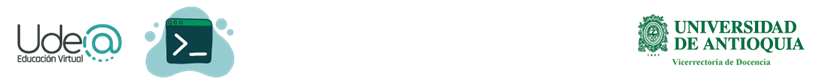

**Laboratorio Tratamiento de Señales III** *Práctica* 06

**Laboratorio: Laboratorio Segmentación de Imágenes**

*   Mateo Muñoz Arroyave
CC 1036676919

*   David Esteban Londoño Patiño
CC 1020465536

**Autor:**
*   Pablo Alejandro Alvarado Duran, PhD.

**Laboratorio Tratamiento de Señales III**

**Facultad de Ingeniería**

**Universidad de Antioquia**

---

## Introducción
La visión por computador (VC) es una rama de la inteligencia artificial, cuyo propósito es extraer información a partir de imágenes, videos y nubes de puntos. La VC abarca técnicas para

- reconocer imágenes
- detectar objetos
- estimar movimientos
- entre otros.

Algunos ejemplos de aplicaciones de la vida real: reconocimiento facial para acceder a teléfonos inteligentes, y procesamiento de video en vehículos autónomos.

## Segmentación de imágenes (SI)

La segmentación de imágenes (SI) es una técnica comúnmente utilizada en el procesamiento y análisis digital de imágenes, y consiste en dividir una imagen en partes o regiones, comúnmente partiendo de las características de los pixeles en la imagen.

La SI es esencial para el reconocimiento de imágenes y detección de objetos. En estos casos, la segmentación de imágenes consiste en separar el primer plano y el fondo de una imágen, o agrupar regiones de pixeles basados en similitudes de color y forma. Por ejemplo, la SI es útil en imágenes médicas para detectar y etiquetar pixeles asociados a un tumor en un órgano de un paciente.  

### Aplicaciones de SI
Diferentes técnicas de segmentación han sido desarrolladas usando conocimiento específico según el área donde se requiera segmentar imágenes. Aplicaciones incluyen imágenes médicas, vehículos autónomos, vigilancia por video.

##### Detección de cáncer
Durante el diagnóstico de cáncer los médicos determinan los tipos de células (cancerígenas o no) presentes en una muestra de tejido. La SI puede aplicarse para agrupar los pixeles asociados a los diferentes tipos de células.


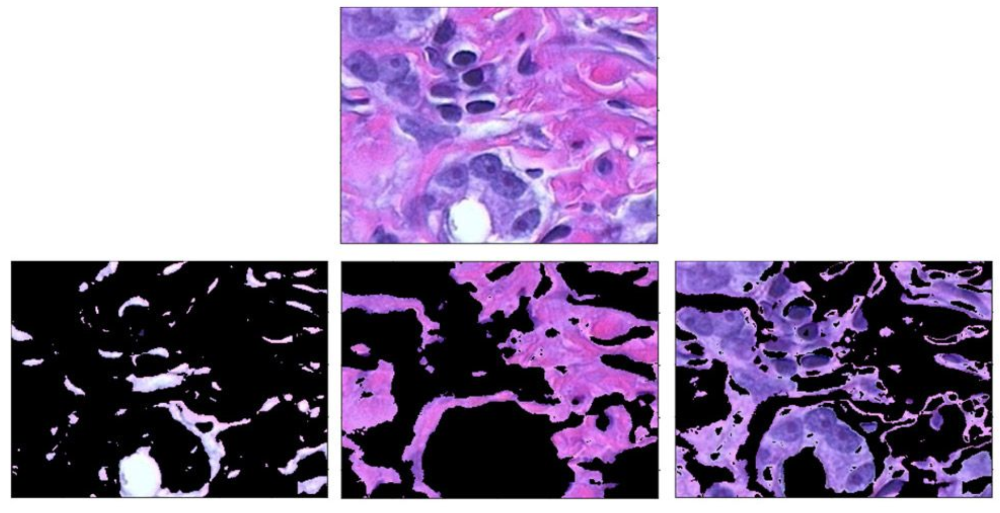

#### Conducción autónoma
El diseño de automóviles autoconducidos requiere al procesamiento y análisis de imágenes con el objetivo de diferenciar los diferentes objetos presentes en una escena (vía y alrededores), esto se conoce como segmentación semántica.

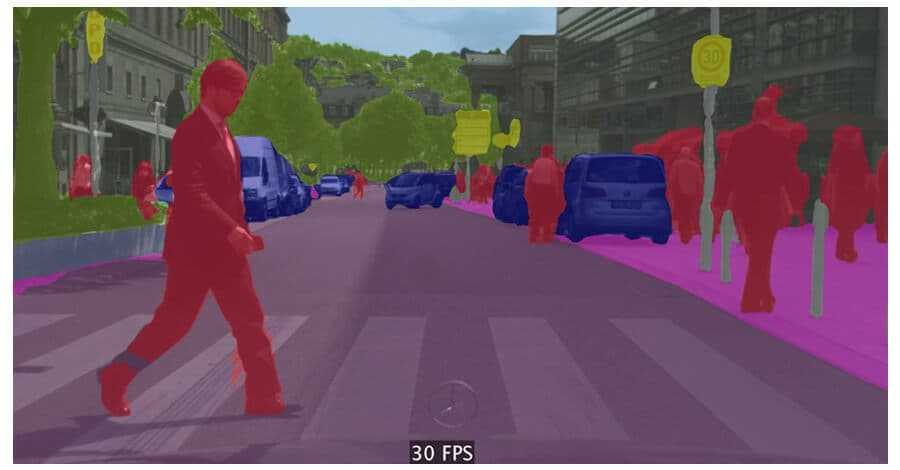

## Principio de funcionamiento
La segmentación de imágenes consiste en etiquetar cada pixel $x_{i,j}$ presente en una imagen $X \in \mathbb{R}^{N \times M}$, generando una cantidad $k$ de grupos llamados regiones $y_{i,j} = k$, cada región está representada por el valor específico que tome la etiqueta $y_{i,j} = k$, donde $k = 1, 2 ,3 \cdots, K$.

Dividir una imágen en regiones permite procesar o analizar sólo los segmentos importantes para una tarea específica, evitando procesar datos (pixeles) de menor relevancia.



In [ ]:
import skimage as ski
import numpy as np
from skimage import data, color, graph
from skimage import segmentation as seg
from matplotlib import pyplot as plt

In [ ]:
# definición de funciones

def show(img):
    fig, ax = plt.subplots(1, 1, figsize=(7, 7))
    ax.imshow(img, cmap=plt.cm.gray) # usar pyplot biultin colormap gray
    ax.set_axis_off()
    plt.show()

def showPair(img,filt_img):
    fig, ax = plt.subplots(1, 2, figsize=(15, 15))
    ax[0].imshow(img, cmap=plt.cm.gray)
    ax[0].set_axis_off()
    ax[1].imshow(filt_img, cmap=plt.cm.gray)
    ax[1].set_axis_off()
    plt.show()

## Tipos de algoritmos para SI
Existen diversos tipos de algoritmos para SI, según el tipo de características de la imagen que utilicen para la segmentación.

## Segmentación basada en discontinuidad
Una técnica común es buscar discontinuidades o cambios abruptos en los valores que toman los pixeles. Las discontinuidades indican por lo general los bordes que definen una región.

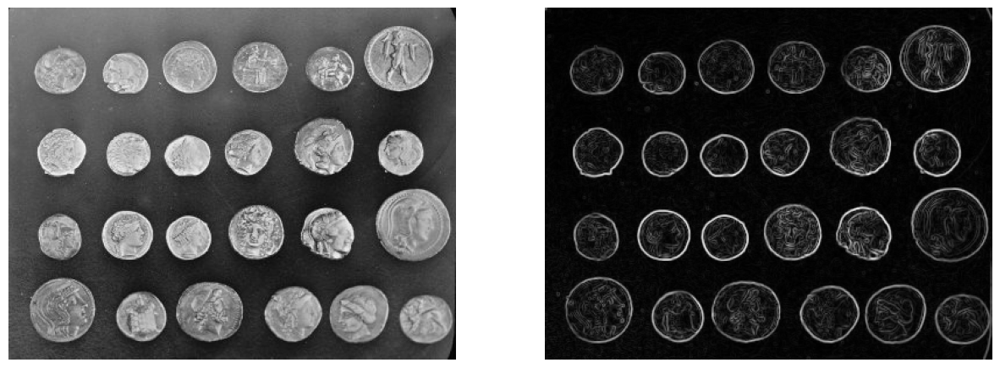

In [ ]:
img = data.coins()
sobimg = ski.filters.sobel(img)
showPair(img,sobimg)

## Segmentación basada en medidas de similitud
Otro enfoque común para detectar regiones en una imagen consiste en agrupar pixeles usando como criterio una medida de similitud entre ellos. Estas medidas de similitud por lo general están basadas en valores de color, forma, y textura. A continuación se abordan diferentes técnicas basadas en similitud.

### Umbralización
Los pixeles son agrupados según su intensidad relativa a un punto de referencia (umbral).

In [ ]:
from skimage.filters import threshold_otsu

!wget -O brain1.jpg "https://static.sciencelearn.org.nz/images/images/000/001/104/embed/75yo_male.jpg?1674165508"
!wget -O brain2.jpg "https://www.melbourneradiology.com.au/wp-content/uploads/2021/06/MRI-BRAIN-WITH-CONTRAST-0002.jpg"

--2023-10-10 17:02:24--  https://static.sciencelearn.org.nz/images/images/000/001/104/embed/75yo_male.jpg?1674165508
Resolving static.sciencelearn.org.nz (static.sciencelearn.org.nz)... 99.84.252.98, 99.84.252.13, 99.84.252.123, ...
Connecting to static.sciencelearn.org.nz (static.sciencelearn.org.nz)|99.84.252.98|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 37393 (37K) [image/jpeg]
Saving to: ‘brain1.jpg’

brain1.jpg          100%[===================>]  36.52K   186KB/s    in 0.2s    

2023-10-10 17:02:25 (186 KB/s) - ‘brain1.jpg’ saved [37393/37393]

--2023-10-10 17:02:25--  https://www.melbourneradiology.com.au/wp-content/uploads/2021/06/MRI-BRAIN-WITH-CONTRAST-0002.jpg
Resolving www.melbourneradiology.com.au (www.melbourneradiology.com.au)... 141.193.213.11, 141.193.213.10
Connecting to www.melbourneradiology.com.au (www.melbourneradiology.com.au)|141.193.213.11|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 37720 (37K) [image

<ipython-input-5-14dd68e5b7fd>:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax[2] = plt.subplot(1, 3, 3, sharex=ax[0], sharey=ax[0])


(-0.5, 511.5, 511.5, -0.5)

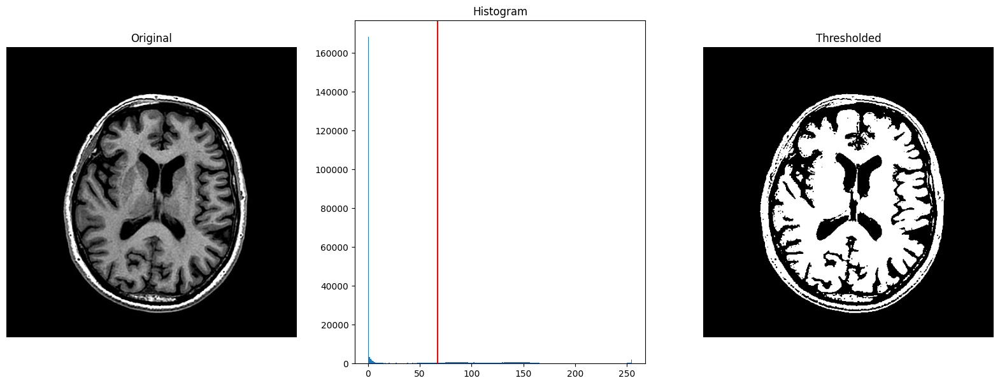

In [ ]:
image = ski.io.imread('brain1.jpg')

thresh = threshold_otsu(image) # ver descripción del método Otsu
binary = image > thresh

fig, axes = plt.subplots(ncols=3, figsize=(20, 7))
ax = axes.ravel()
ax[0] = plt.subplot(1, 3, 1)
ax[1] = plt.subplot(1, 3, 2)
ax[2] = plt.subplot(1, 3, 3, sharex=ax[0], sharey=ax[0])

ax[0].imshow(image, cmap=plt.cm.gray)
ax[0].set_title('Original')
ax[0].axis('off')

ax[1].hist(image.ravel(), bins=256)
ax[1].set_title('Histogram')
ax[1].axvline(thresh, color='r')

ax[2].imshow(binary, cmap=plt.cm.gray)
ax[2].set_title('Thresholded')
ax[2].axis('off')

#### Ejemplo doble umbral

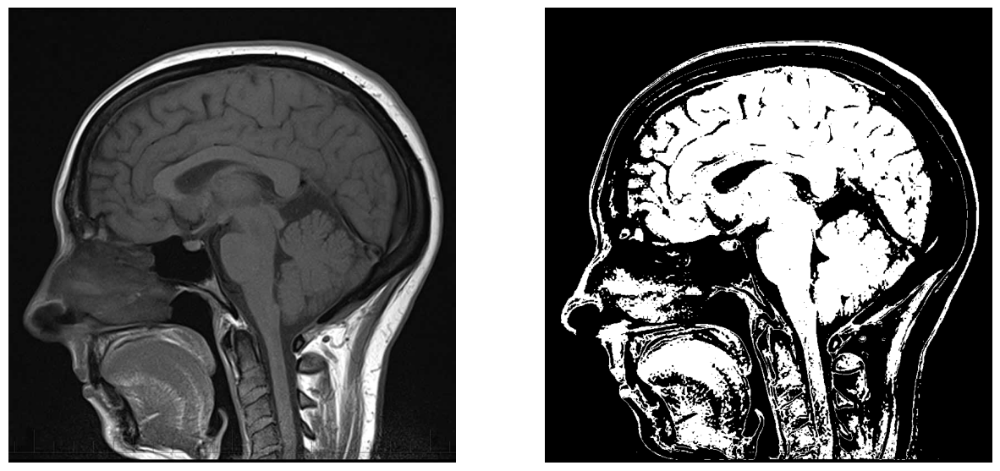

In [ ]:
image = ski.io.imread('brain2.jpg')[:,:,2]
binary = np.logical_and(image > 60, image < 100)
showPair(image, binary)

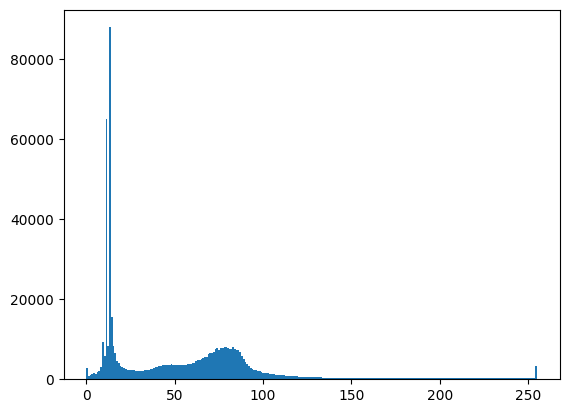

In [ ]:
plt.hist(image.ravel(), bins=256);


### Agrupamiento
Esta técnica permite agrupar pixeles usando aprendizaje máquina no supervisado. En este caso aplicaremos el algoritmo de K-medias.

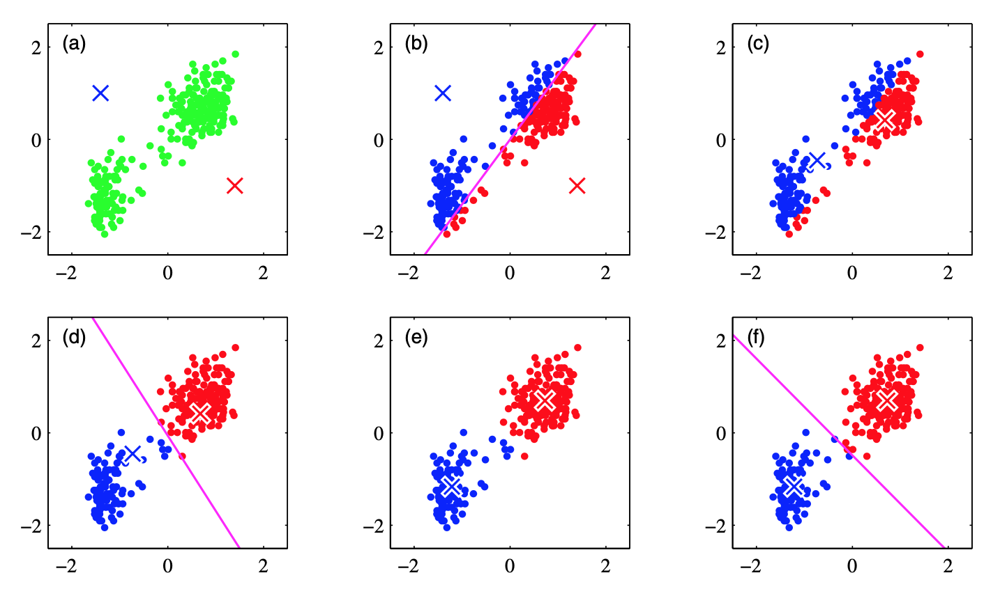

In [ ]:
img = data.astronaut()
segments = seg.slic(img, n_segments=50, compactness=10)

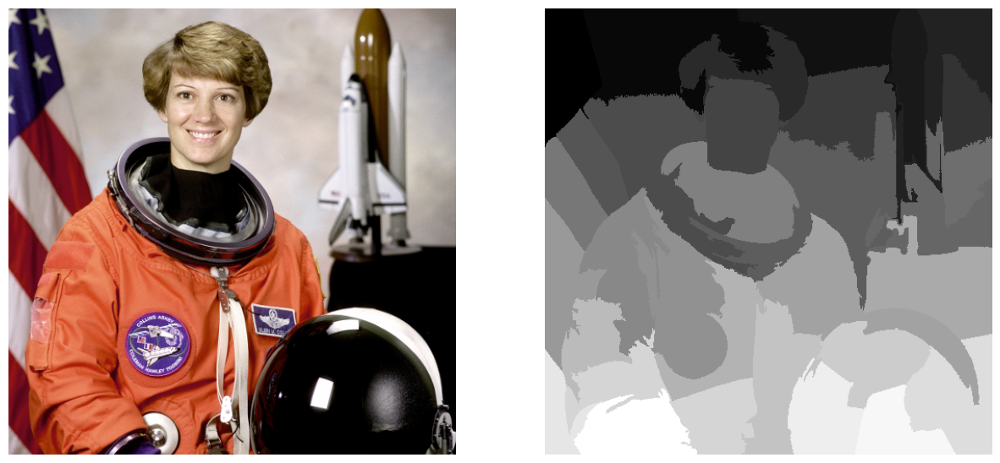

In [ ]:
showPair(img, segments)


### Watersheds (Regiones)

La imágen se divide en regiones de características similares. Cada región es un grupo de pixeles los cuales son formados tomando como referencia un punto o pixel raíz. Las regiones pueden fundirse, incrementar, o decrecer a medida que se adicionan o remueven pixeles.

El algoritmo Watersheds trabaja en imágenes en escala de grises e interpreta la intensidad de cada pixel como una altura (mapa topográfico), detectando crestas y valles/cuencas. De esta manera la imagen se divide en múltiples regiones basados en la altura del pixel, agrupado pixeles con la misma intensidad de gris.

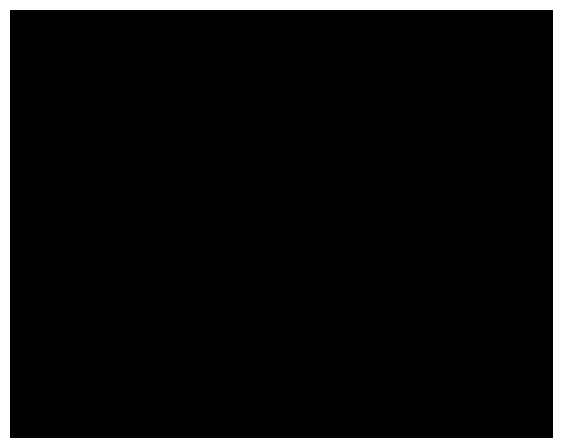

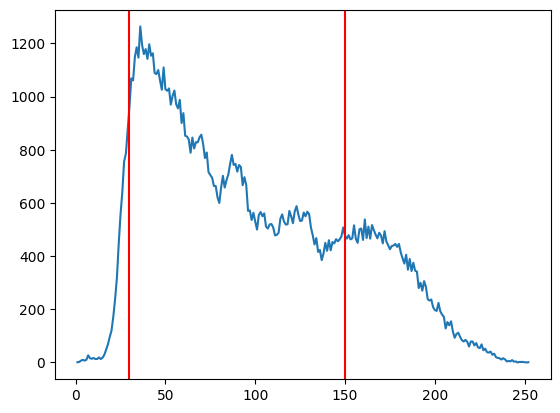

In [ ]:
coins = data.coins()
markers = np.zeros_like(coins)
hist, bins = ski.exposure.histogram(coins)


show(markers)  # marcadores iniciales


plt.figure()
plt.plot(bins, hist) # histograma
plt.axvline(x=30, color='r' )
plt.axvline(x=150, color='r' )

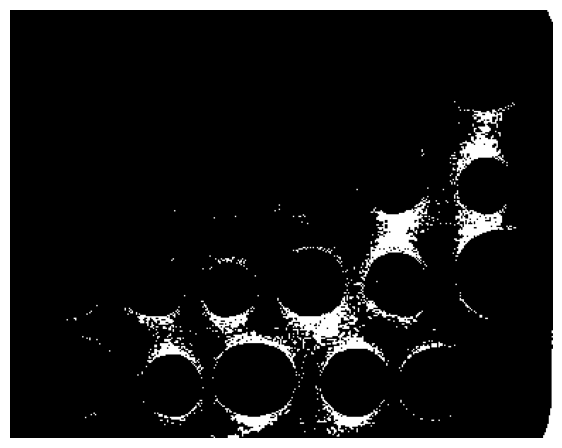

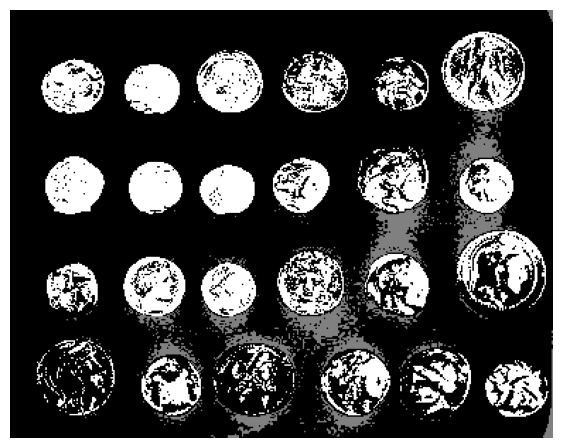

In [ ]:
markers[coins < 30] = 1
show(markers)

markers[coins > 150] = 2
show(markers)

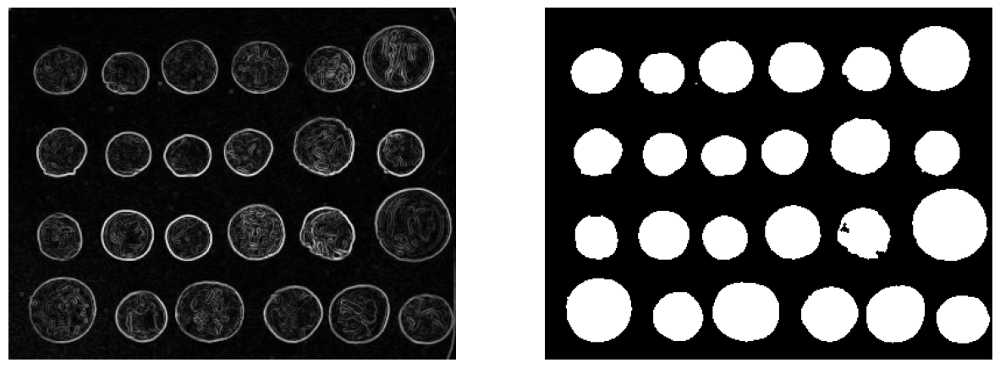

In [ ]:
elevation_map = ski.filters.sobel(data.coins())
segmentation_coins = seg.watershed(elevation_map, markers)
showPair(elevation_map, segmentation_coins)

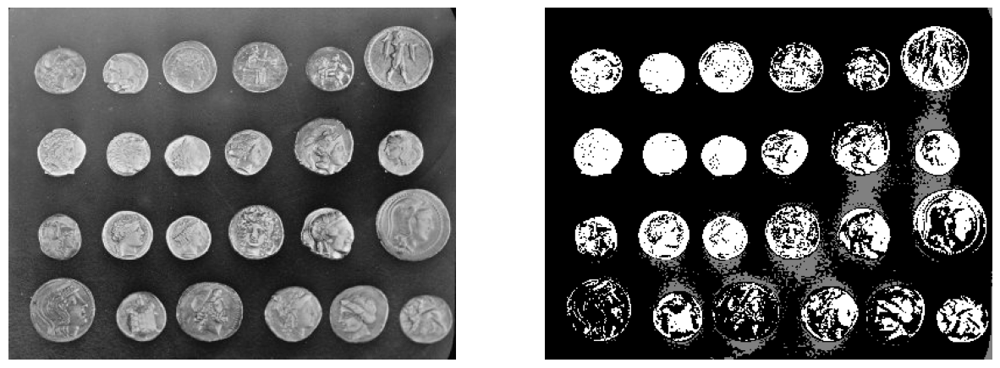

In [ ]:
showPair(coins, markers)

# Aprendizaje profundo para segmentación de imágenes
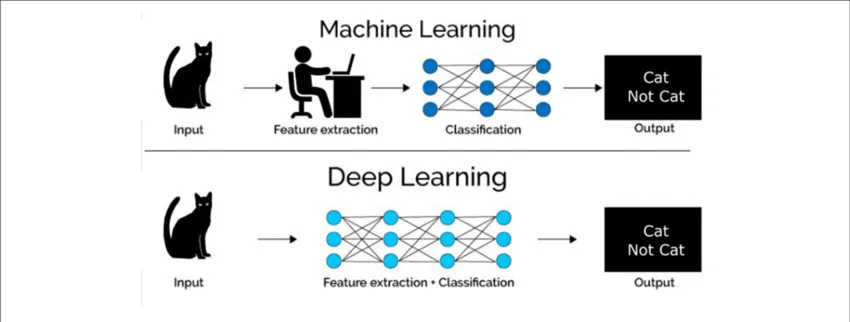


### Ejemplo red neuronal
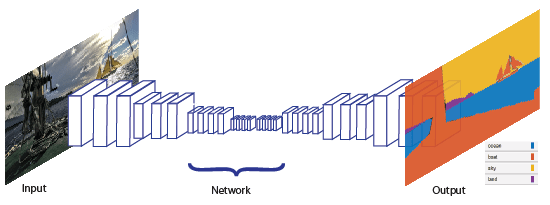


# Trabajo de laboratorio
 En el laboratorio anterior estudiamos diferentes tipos de filtros, y entendimos cómo diferentes tipos de ruido afectan a los datos. En ciertas aplicaciones de tratamiento y análisis de imágenes es necesario tener una etapa previa a la segmentación, de manera que artefactos (datos espurios o outliers) y ruido sean eliminados de los datos.



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, img_as_float, io, filters, segmentation, color, morphology
from skimage.util import random_noise
from skimage.segmentation import random_walker, chan_vese, flood, flood_fill


1. Para hacer evidente la necesidad de limpiar las imágenes antes de segmentarlas, vamos a añadir ruido sal y pimienta (caso A), y ruido Gaussiano (caso B) a una imagen obtenida al escanear una hoja con texto, esta imagen corresponde a ```skimage.data.page()```.

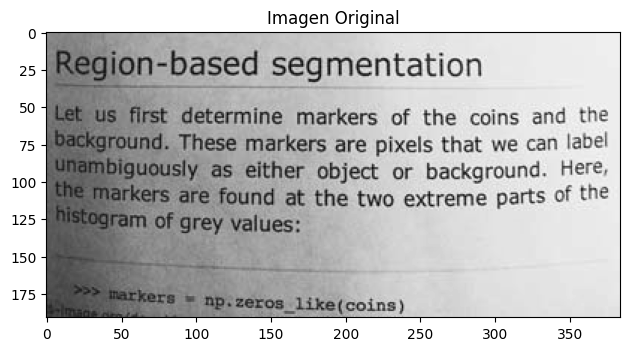

In [ ]:
imagen_original = img_as_float(data.page())

plt.plot()
plt.imshow(imagen_original, cmap='gray')
plt.title('Imagen Original')

plt.tight_layout()
plt.show()

In [ ]:
# Ruido sal y pimienta
imagen_con_ruido_a = random_noise(imagen_original, mode='s&p', amount=0.05)

# Ruido Gaussiano
mean = 0
var = 0.01
sigma = var ** 0.5
imagen_con_ruido_b = random_noise(imagen_original, mode='gaussian', mean=mean, var=var)

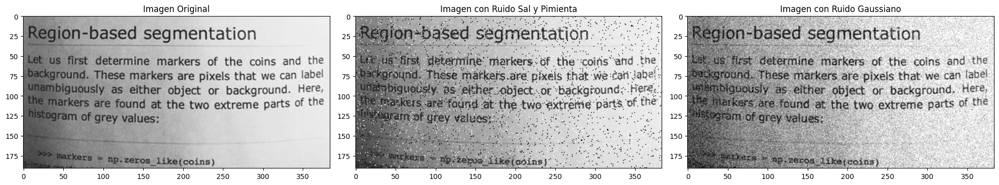

In [ ]:
plt.figure(figsize=(20, 8))
plt.subplot(131)
plt.imshow(imagen_original, cmap='gray')
plt.title('Imagen Original')

plt.subplot(132)
plt.imshow(imagen_con_ruido_a, cmap='gray')
plt.title('Imagen con Ruido Sal y Pimienta')

plt.subplot(133)
plt.imshow(imagen_con_ruido_b, cmap='gray')
plt.title('Imagen con Ruido Gaussiano')

plt.tight_layout()
plt.show()

2. Posteriormente, aplique un filtro para reducir la cantidad de ruido (recuerde los buenos resultados obtenidos con el filtro de mediana). A continuación, aplique dos técnicas de segmentación tanto a la imagen ruidosa como a la imagen filtrada. ¿Qué diferencias presentan estos resultados? ¿Cuál es la causa de estas diferencias? ¿Qué tanto afectan los parámetros del ruido añadido, los parámetros del filtro, y los parámetros de segmentación a los resultados? Por favor argumente su respuesta.

In [ ]:
imagen_filtrada_a = filters.median(imagen_con_ruido_a, footprint=np.ones((3, 3)))
imagen_filtrada_b = filters.median(imagen_con_ruido_b, footprint=np.ones((3, 3)))

In [ ]:
# Aplicar la segmentación (umbralización)
umbral_a = filters.threshold_otsu(imagen_filtrada_a)
segmentacion_a = imagen_filtrada_a > umbral_a

umbral_ruido_a = filters.threshold_otsu(imagen_con_ruido_a)
segmentacion_ruido_a = imagen_con_ruido_a > umbral_ruido_a

umbral_b = filters.threshold_otsu(imagen_filtrada_b)
segmentacion_b = imagen_filtrada_b > umbral_b

umbral_ruido_b = filters.threshold_otsu(imagen_con_ruido_b)
segmentacion_ruido_b = imagen_con_ruido_b > umbral_ruido_b

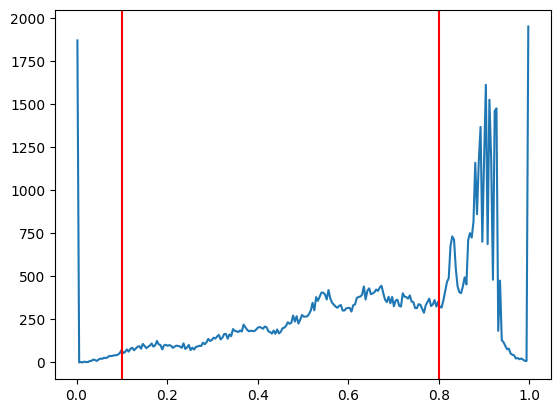

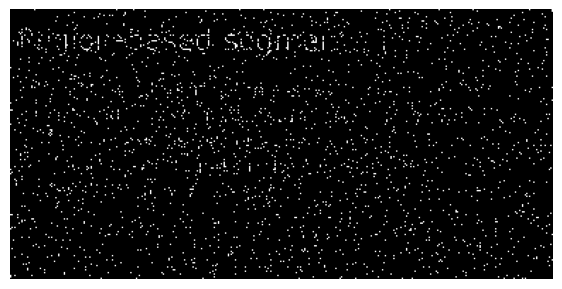

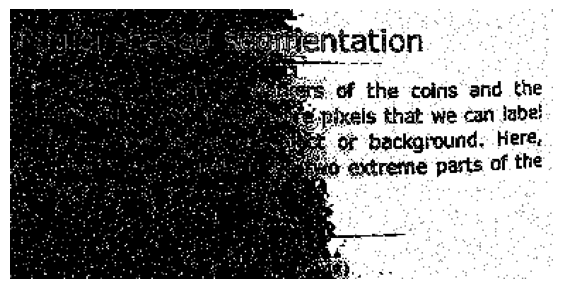

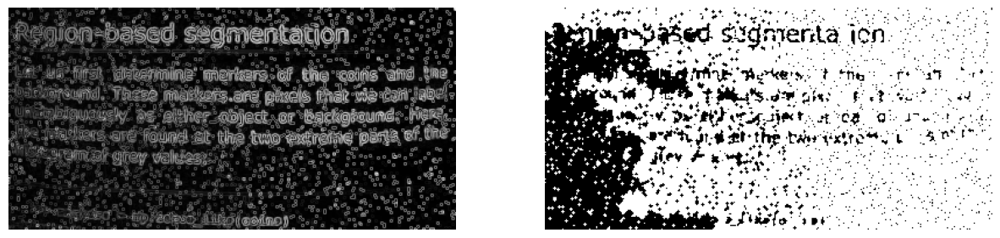

In [ ]:
markers_ruido_a = np.zeros_like(imagen_con_ruido_a)
hist, bins = ski.exposure.histogram(imagen_con_ruido_a)

plt.figure()
plt.plot(bins, hist) # histograma
plt.axvline(x=0.1, color='r' )
plt.axvline(x=0.8, color='r' )

markers_ruido_a[imagen_con_ruido_a < 0.1] = 1
show(markers_ruido_a)

markers_ruido_a[imagen_con_ruido_a > 0.8] = 2
show(markers_ruido_a)

elevation_map = ski.filters.sobel(imagen_con_ruido_a)
segmentation_ruido_a = seg.watershed(elevation_map, markers_ruido_a)
showPair(elevation_map, segmentation_ruido_a)

###Imagen filtrada CASO A (Sal y pimienta)

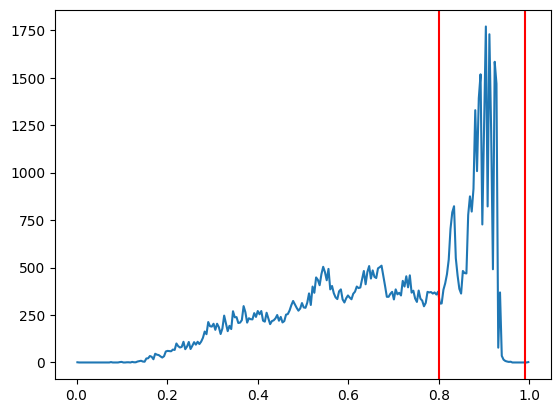

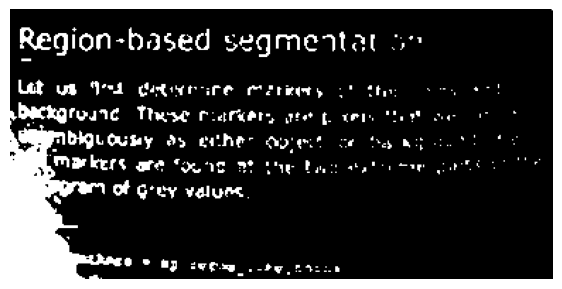

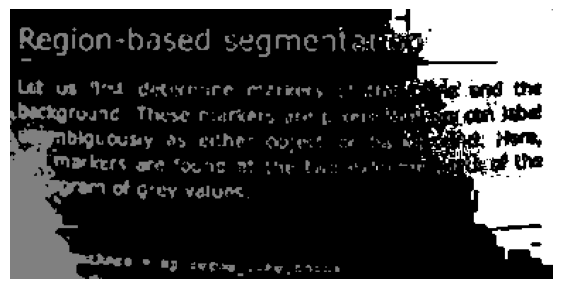

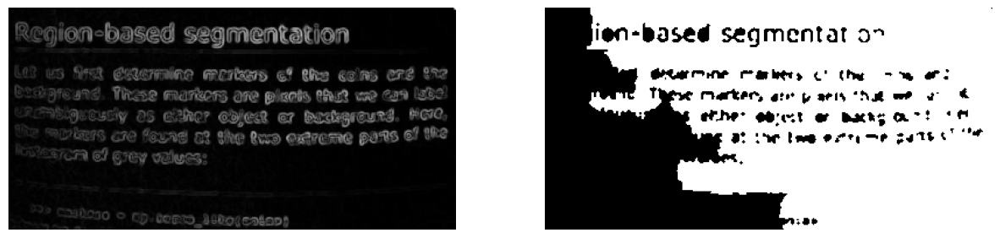

In [ ]:
markers_filtrada_a = np.zeros_like(imagen_filtrada_a)
hist, bins = ski.exposure.histogram(imagen_filtrada_a)

plt.figure()
plt.plot(bins, hist) # histograma
plt.axvline(x=0.8, color='r' )
plt.axvline(x=0.99, color='r' )

markers_filtrada_a[imagen_filtrada_a < 0.4] = 1
show(markers_filtrada_a)

markers_filtrada_a[imagen_filtrada_a > 0.9] = 2
show(markers_filtrada_a)

elevation_map = ski.filters.sobel(imagen_filtrada_a)
segmentation_filtrada_a = seg.watershed(elevation_map, markers_filtrada_a)
showPair(elevation_map, segmentation_filtrada_a)

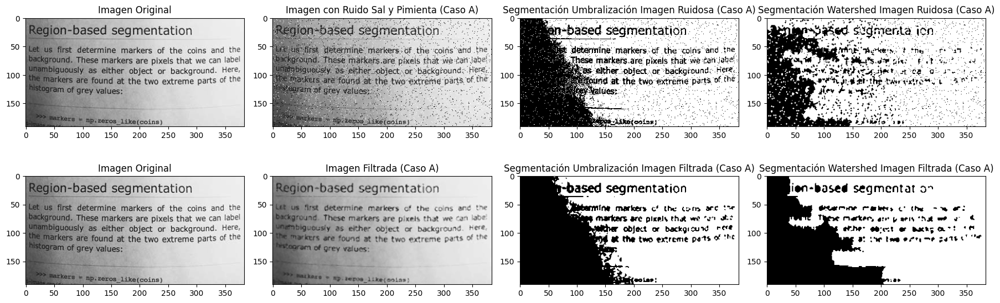

In [ ]:
plt.figure(figsize=(18, 6))

plt.subplot(241)
plt.imshow(imagen_original, cmap='gray')
plt.title('Imagen Original')

plt.subplot(242)
plt.imshow(imagen_con_ruido_a, cmap='gray')
plt.title('Imagen con Ruido Sal y Pimienta (Caso A)')

plt.subplot(243)
plt.imshow(segmentacion_ruido_a, cmap='gray')
plt.title('Segmentación Umbralización Imagen Ruidosa (Caso A)')

plt.subplot(244)
plt.imshow(segmentation_ruido_a, cmap='gray')
plt.title('Segmentación Watershed Imagen Ruidosa (Caso A)')

plt.subplot(245)
plt.imshow(imagen_original, cmap='gray')
plt.title('Imagen Original')

plt.subplot(246)
plt.imshow(imagen_filtrada_a, cmap='gray')
plt.title('Imagen Filtrada (Caso A)')

plt.subplot(247)
plt.imshow(segmentacion_a, cmap='gray')
plt.title('Segmentación Umbralización Imagen Filtrada (Caso A)')

plt.subplot(248)
plt.imshow(segmentation_filtrada_a, cmap='gray')
plt.title('Segmentación Watershed Imagen Filtrada (Caso A)')

plt.tight_layout()
plt.show()

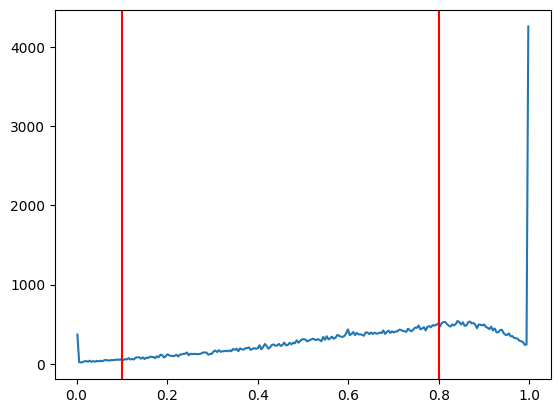

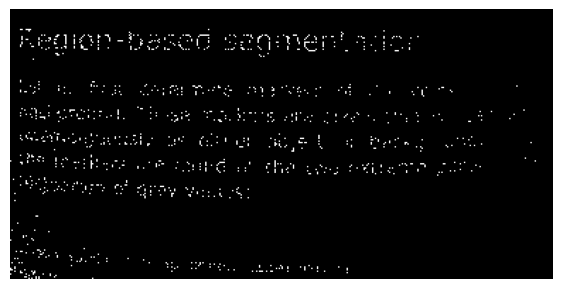

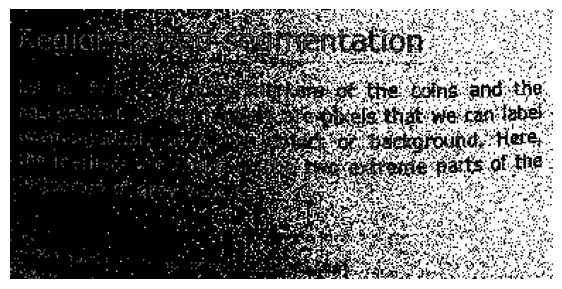

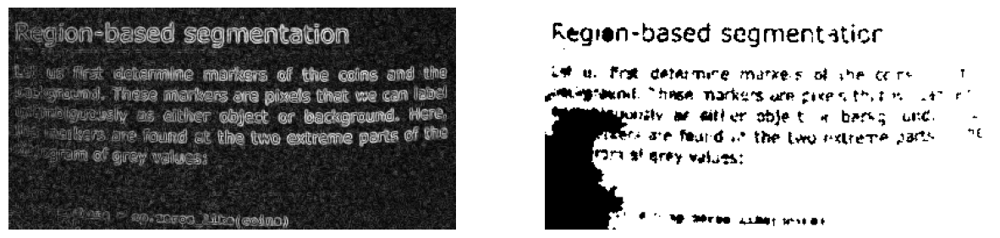

In [ ]:
markers_ruido_b = np.zeros_like(imagen_con_ruido_b)
hist, bins = ski.exposure.histogram(imagen_con_ruido_b)

plt.figure()
plt.plot(bins, hist) # histograma
plt.axvline(x=0.1, color='r' )
plt.axvline(x=0.8, color='r' )

markers_ruido_b[imagen_con_ruido_b < 0.1] = 1
show(markers_ruido_b)

markers_ruido_b[imagen_con_ruido_b > 0.8] = 2
show(markers_ruido_b)

elevation_map = ski.filters.sobel(imagen_con_ruido_b)
segmentation_ruido_b = seg.watershed(elevation_map, markers_ruido_b)
showPair(elevation_map, segmentation_ruido_b)

###Imagen filtrada CASO B (Gaussiano)

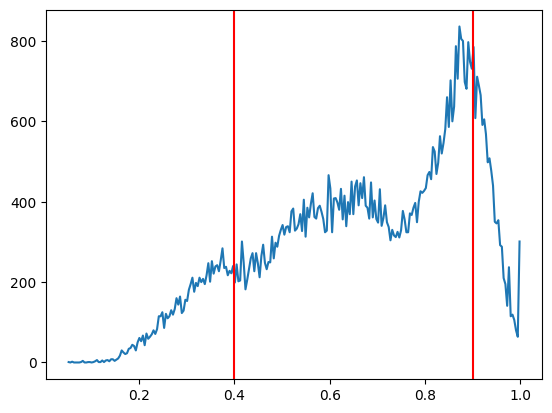

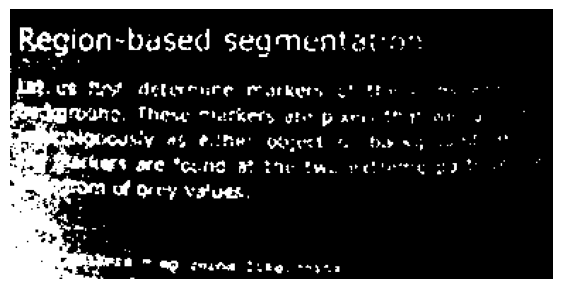

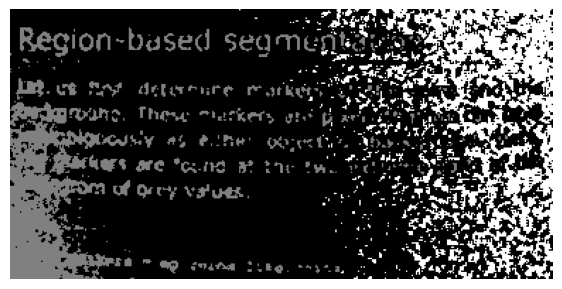

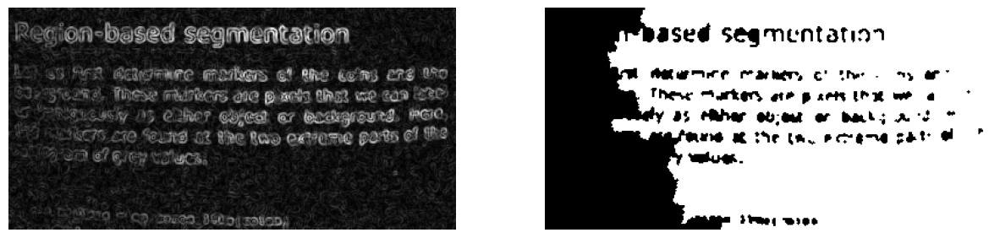

In [ ]:
markers_filtrada_b = np.zeros_like(imagen_filtrada_b)
hist, bins = ski.exposure.histogram(imagen_filtrada_b)

plt.figure()
plt.plot(bins, hist) # histograma
plt.axvline(x=0.4, color='r' )
plt.axvline(x=0.9, color='r' )

markers_filtrada_b[imagen_filtrada_b < 0.4] = 1
show(markers_filtrada_b)

markers_filtrada_b[imagen_filtrada_b > 0.9] = 2
show(markers_filtrada_b)

elevation_map = ski.filters.sobel(imagen_filtrada_b)
segmentation_filtrada_b = seg.watershed(elevation_map, markers_filtrada_b)
showPair(elevation_map, segmentation_filtrada_b)

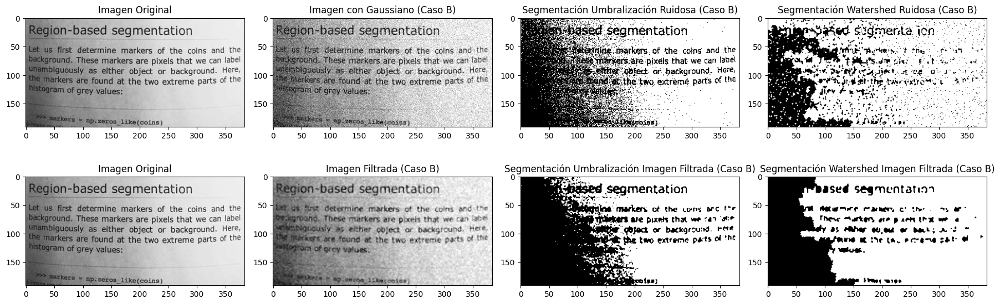

In [ ]:
plt.figure(figsize=(18, 6))

plt.subplot(241)
plt.imshow(imagen_original, cmap='gray')
plt.title('Imagen Original')

plt.subplot(242)
plt.imshow(imagen_con_ruido_b, cmap='gray')
plt.title('Imagen con Gaussiano (Caso B)')

plt.subplot(243)
plt.imshow(segmentacion_ruido_b, cmap='gray')
plt.title('Segmentación Umbralización Ruidosa (Caso B)')

plt.subplot(244)
plt.imshow(segmentation_ruido_a, cmap='gray')
plt.title('Segmentación Watershed Ruidosa (Caso B)')

plt.subplot(245)
plt.imshow(imagen_original, cmap='gray')
plt.title('Imagen Original')

plt.subplot(246)
plt.imshow(imagen_filtrada_b, cmap='gray')
plt.title('Imagen Filtrada (Caso B)')

plt.subplot(247)
plt.imshow(segmentacion_b, cmap='gray')
plt.title('Segmentación Umbralización Imagen Filtrada (Caso B)')

plt.subplot(248)
plt.imshow(segmentation_filtrada_b, cmap='gray')
plt.title('Segmentación Watershed Imagen Filtrada (Caso B)')

plt.tight_layout()
plt.show()

3. Investige el principio de funcionamiento de las técnicas (implementadas en ```skimage```) de segmentación *Random Walker* y *Chan-vese* y apliquelas a la imagen ```skimage.data.coins()```, de manera que se diferencien las monedas (foreground) del fondo (background). Compare los resultados comparados con segmentación basada umbral (thresholding). Para este caso específico, ¿qué técnica presenta mejores resultados y por qué?

Random Walker Segmentation:

El algoritmo del "Random Walker" es un enfoque basado en la teoría de la difusión de Markov en grafos. Funciona creando un grafo a partir de la imagen, donde cada píxel es un nodo y las conexiones entre los nodos se basan en la similitud de intensidad entre píxeles.
Se etiquetan algunos píxeles como "semillas" para el foreground y el fondo.
Luego, se utiliza el algoritmo del "Random Walker" para asignar probabilidades de pertenencia a cada píxel para las etiquetas de foreground y fondo. Los píxeles son asignados a las etiquetas de acuerdo con las probabilidades más altas.
Este enfoque es útil cuando la segmentación no se puede lograr fácilmente con umbrales simples y cuando hay regiones con intensidades similares.

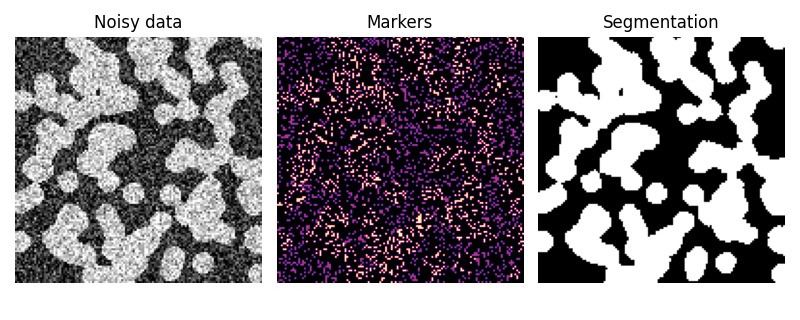

Chan-Vese Segmentation:

El algoritmo de Chan-Vese es un enfoque de segmentación basado en la minimización de energía. Busca encontrar una curva que divide la imagen en regiones de foreground y fondo minimizando una función de energía que tiene en cuenta la coherencia de la intensidad dentro de cada región.
La función de energía se compone de términos de regularización y términos de ajuste de datos que comparan la intensidad de los píxeles con los valores medios de intensidad de las regiones de foreground y fondo.
Este método es efectivo para imágenes con regiones bien definidas y no es necesario especificar semillas iniciales como en el "Random Walker".

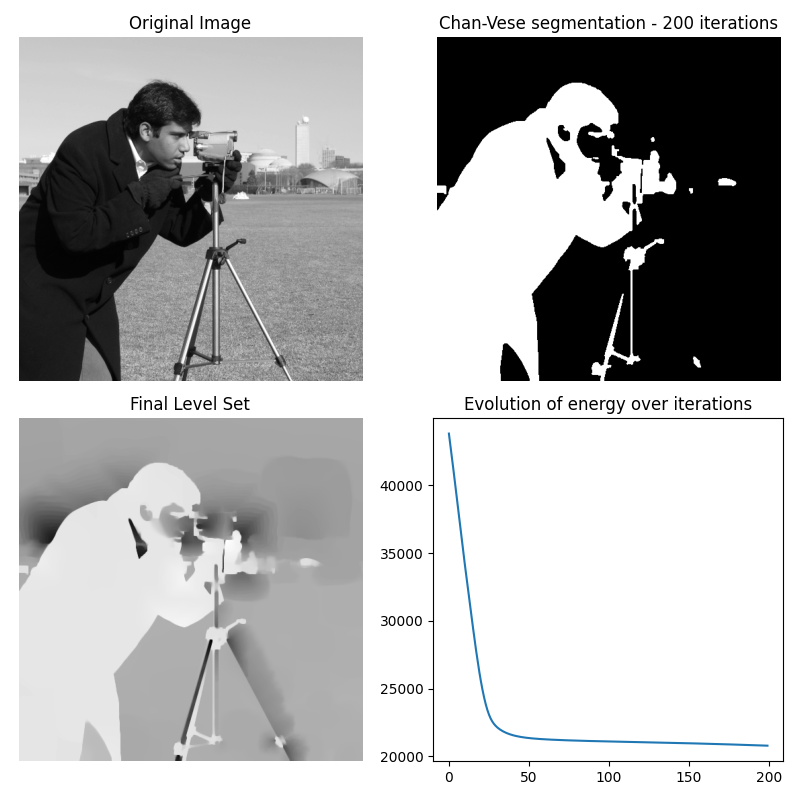

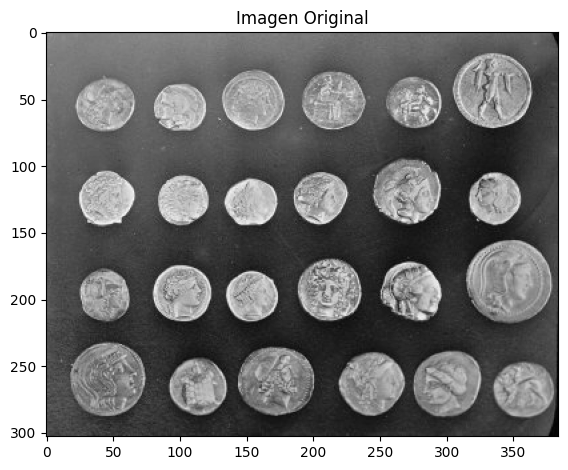

In [ ]:
imagen_coins = data.coins()

plt.plot()
plt.imshow(imagen_coins, cmap='gray')
plt.title('Imagen Original')

plt.tight_layout()
plt.show()

In [ ]:
# Segmentación basada en umbral (thresholding)
umbral = filters.threshold_otsu(imagen_coins)
segmentacion_umbral = imagen_coins > umbral

# Random Walker Segmentation
semillas_rw = np.zeros_like(imagen_coins)
semillas_rw[10:-10, 10:-10] = 1  # Definir semillas para foreground
segmentacion_rw = random_walker(imagen_coins, semillas_rw)

# Chan-Vese Segmentation
segmentacion_cv = chan_vese(imagen_coins)

/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:348: UserWarning: The probability range is outside [0, 1] given the tolerance `prob_tol`. Consider decreasing `beta` and/or decreasing `tol`.
  return func(*args, **kwargs)


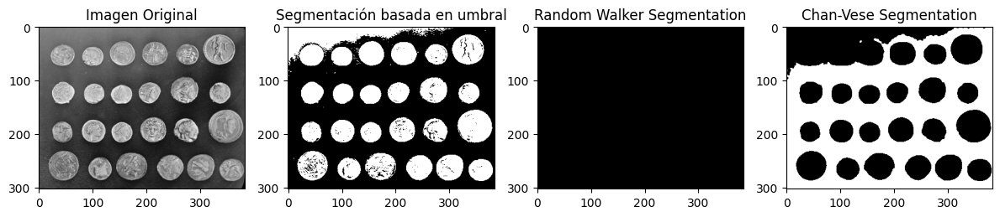

In [ ]:
# Visualizar los resultados
plt.figure(figsize=(12, 6))

plt.subplot(141)
plt.imshow(imagen_coins, cmap='gray')
plt.title('Imagen Original')

plt.subplot(142)
plt.imshow(segmentacion_umbral, cmap='gray')
plt.title('Segmentación basada en umbral')

plt.subplot(143)
plt.imshow(segmentacion_rw, cmap='gray')
plt.title('Random Walker Segmentation')

plt.subplot(144)
plt.imshow(segmentacion_cv, cmap='gray')
plt.title('Chan-Vese Segmentation')

plt.tight_layout()
plt.show()

En el caso de la imagen de monedas, donde las monedas tienen una intensidad significativamente diferente al fondo, la segmentación basada en umbral (thresholding) proporciona resultados muy buenos y simples. La umbralización permite una separación efectiva del foreground y el fondo.

Random Walker Segmentation y Chan-Vese Segmentation son útiles cuando las diferencias de intensidad no son tan marcadas o cuando se necesita una segmentación más precisa. En este caso específico, dado que las monedas son claramente distinguibles en términos de intensidad, la segmentación basada en umbral es la más apropiada y produce resultados satisfactorios de manera más sencilla.

4. Finalmente, escoja alguna técnica de segmentación y separe la nariz del gato presente en la imagen ```skimage.data.cat()```. Describa los argumentos que lo llevaron a escoger la técnica aplicada. Los resultados corresponden a lo esperado? argumente por favor.

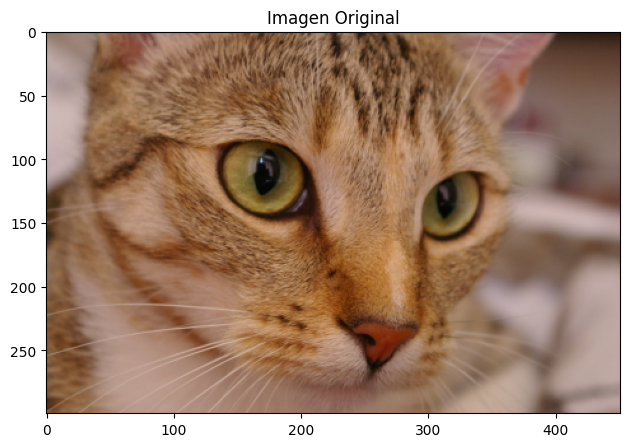

In [ ]:
imagen_gato = data.cat()

plt.plot()
plt.imshow(imagen_gato, cmap='gray')
plt.title('Imagen Original')
# plt.xlim(260,270)
# plt.ylim(245,235)

plt.tight_layout()
plt.show()

In [32]:
# Random Walker Segmentation
cat_sobel = filters.sobel(imagen_gato[..., 0])
cat_nose = flood(cat_sobel, (240, 265), tolerance=0.03)


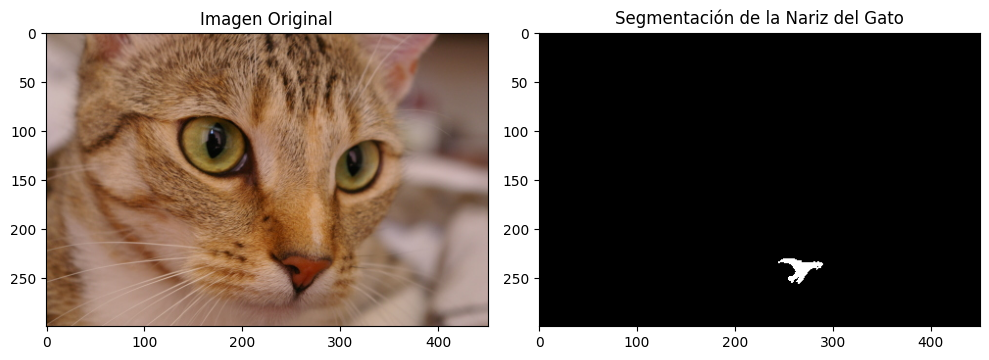

In [33]:
plt.figure(figsize=(10, 5))

plt.subplot(121)
plt.imshow(imagen_gato)
plt.title('Imagen Original')

plt.subplot(122)
plt.imshow(cat_nose, cmap='gray')
plt.title('Segmentación de la Nariz del Gato')

plt.tight_layout()
plt.show()

La nariz del gato tiene una intensidad diferente en comparación con el pelaje y el fondo de la imagen. Esto sugiere un proceso donde priemro se utiliza el operador Sobel para realizar detección de bordes en la imagen, luego se aplica la tecnica o proceso de flood fill en la imagen resultante a partir de una semilla ubicada en la coordenada (240, 265) donde se utiliza una tolerancia del 3%. Sin embargo, la iluminación puede variar en diferentes partes de la imagen debido a las sombras y la textura del pelaje del gato. La técnica de flood fill escogida ha segmentado efectivamente la nariz del gato por medio de la semilla y ha separado esta región del resto de la imagen.

Los resultados corresponden a lo esperado, ya que la nariz del gato tiene una intensidad diferente y es una región bien definida en la imagen. La tecnica flood fill ha sido útil para tratar las variaciones locales de con respecto a las coordenada asigandas y especificadas y asi poder separar lo deseado de la demas imagen como la textura del pelaje del gato.

## Conclusiones

* La elección de la técnica de segmentación depende de las características de la imagen y los objetivos del procesamiento, cada una de las diferentes técnicas de segmentación analizadas, como umbralización, Random Walker,  Chan-Vese y flood fill, son más apropiadas en diferentes contextos. La elección de la técnica adecuada depende de la naturaleza de la imagen y de lo que se pretende lograr. Por lo tanto, es fundamental comprender las características de la imagen antes de seleccionar la técnica de segmentación.

* Aplicar un preprocesamiento adecuado, como la eliminación de ruido, puede mejorar significativamente los resultados de la segmentación. Además, ajustar los parámetros de las técnicas de segmentación, como los umbrales o los tamaños de ventana, puede tener un impacto significativo en la calidad de la segmentación. Por lo tanto, es importante experimentar con diferentes configuraciones para obtener los mejores resultados.


* Ninguna técnica de segmentación es universalmente aplicable. Cada técnica tiene sus propias limitaciones y suposiciones. Por ejemplo, la umbralización puede ser efectiva cuando hay diferencias de intensidad claras, pero puede fallar en imágenes con iluminación variable. Comprender las limitaciones de las técnicas es esencial para evitar resultados erróneos y elegir la estrategia adecuada. Ademas se puede ver como la tecnica aplicando flood fill puede servir como herramienta para determinar un segmento de la imagen dependiendo de una coordenada asiganda y asi poder enfocar solo la parte deseada con respecto a esa semilla.


# Referencias

https://www.mathworks.com/discovery/computer-vision.html

https://www.mathworks.com/discovery/image-segmentation.html

https://datagen.tech/guides/image-annotation/image-segmentation/

https://scikit-image.org/docs/stable/api/skimage.segmentation.html

https://scikit-image.org/skimage-tutorials/lectures/4_segmentation.html

https://scikit-image.org/docs/stable/api/skimage.data.html

https://scikit-image.org/docs/stable/auto_examples/data/plot_general.html

https://scikit-image.org/docs/stable/user_guide/getting_started.html

https://scikit-image.org/docs/stable/api/skimage.filters.html#skimage.filters.threshold_sauvola